In [1]:
import logging
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
import palantir
import scanpy as sc
import scvelo as scv
import cellrank as cr
import scvi
import phate
import plotly.express as px
import numpy as np
from dash import Dash, dcc, html, Input, Output
scvi.settings.seed = 1995
from anndata import AnnData
import time

import pandas as pd

import os
import sys
os.environ['R_HOME'] = sys.exec_prefix+"/lib/R/"

# Plotting
import matplotlib
import matplotlib.pyplot as plt
import matplotlib as mpl

from copy import copy
reds = copy(mpl.cm.Reds)
reds.set_under("lightgray")

def matplotlib_to_plotly(cmap, pl_entries):
    h = 1.0/(pl_entries-1)
    pl_colorscale = []

    for k in range(pl_entries):
        C = list(map(np.uint8, np.array(cmap(k * h)[:3]) * 255))
        pl_colorscale.append([k*h, 'rgb'+str((C[0], C[1], C[2]))])

    return pl_colorscale

plotly_reds = matplotlib_to_plotly(reds, 255)
plotly_reds[0] = [0.0, 'rgb(211, 211, 211)']
sc.set_figure_params(dpi=50,figsize=[6,4])

# Inline plotting
%matplotlib inline

project_directory = '/Cranio_Lab/Louk_Seton/mesenchyme_project_2023'
os.chdir(os.path.expanduser("~")+project_directory)

Global seed set to 1995


In [2]:
###custom functions
from typing import TYPE_CHECKING, Literal, get_args
_Method = Literal["logreg", "t-test", "wilcoxon", "t-test_overestim_var"]
def plot_deg_embedding(
    adata: AnnData,
    method: _Method,
    groupby: str = 'leiden',
    key_added: str | None = None,
    cluster_name: str = '0',
    n_genes: int = 100,
    basis: str = 'X_scvi_MDE',
) -> AnnData | None:
    avail_methods = set(get_args(_Method))
    if method not in avail_methods:
        raise ValueError(f"Method must be one of {avail_methods}.")
    
    if key_added is None:
        key_added = "rank_genes_groups_"+method
    
    sc.set_figure_params(dpi=50,figsize=[6,4]) #small figures otherwise your notebook will crash
    sc.tl.rank_genes_groups(adata, groupby = groupby, method=method, key_added = key_added)
    genes = adata.uns[key_added]['names'][cluster_name][:n_genes].tolist()
    sc.pl.embedding(adata,
                    basis=basis,
                    color=[groupby]+genes,
                    frameon=False,
                    groups=cluster_name,
                    ncols=4,
                    cmap = reds,
                    vmin=0.1,
                   )

from anndata import AnnData
def scvi_anndata_test(
    adata: AnnData,
    batch_key: str = 'batch',
    continuous_covariate_keys: list = ['S_score','G2M_score'],
    categorical_covariate_keys: list = None,
    layer: str='original_counts',
    n_latent: int = 20,
    n_layers: int = 1,
    max_epochs: int = 500,
    n_neighbors: int = 15,
    resolution: int = 1,
    key_added: str | None = None,
    leiden_key: str = 'leiden_scvi',
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    if key_added is None:
        latent_key = "X_scvi"
        mde_key = "X_scvi_MDE"
    else:
        latent_key = key_added + "_scvi"
        mde_key = key_added + "_scvi_MDE"
    
    scvi.model.SCVI.setup_anndata(adata, #anndata object
                                  batch_key = batch_key, #categorical key for batch correction
                                  continuous_covariate_keys = continuous_covariate_keys,
                                                                #'total_counts',
                                                                #'pct_counts_mt',
                                                                #continuous key for cell cycle correction
                                  categorical_covariate_keys = categorical_covariate_keys,
                                  layer = layer) #layer with unmodified counts
    
    adata_model = scvi.model.SCVI(adata,
                                  n_latent = n_latent, #n_latent number of dimensions in latent space (think PCA but different)
                                  n_layers = n_layers, #n_layers number of layers in the neural network
                                 )
    
    print(adata_model.view_anndata_setup(adata))
    
    
    adata_model.train(
        max_epochs = max_epochs, #change how many runs it should train on
    )
    
    adata.obsm[latent_key] = adata_model.get_latent_representation()
    
    sc.pp.neighbors(adata,  #name of anndata object
                    n_neighbors = n_neighbors,
                    use_rep = latent_key,
                   )
    sc.tl.leiden(adata, #name of anndata object
                 resolution = resolution,
                 key_added = leiden_key
                )
    
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[latent_key])  
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

    
    
from anndata import AnnData
def harmony_integrate_pipe(
    adata: AnnData, #input anndata object
    layer: str = 'original_counts', #layer with unmodified counts
    target_sum: int = 1e4, #target sum for normalization
    max_value: int = 10, #max value for scaling
    batch_key: str = 'batch', #batch key
    rep_key: str = 'X_pca_harmony', #adjusted harmony pca
    mde_key: str = 'X_harmony_MDE', #mde embedding key
    resolution: int = 0.5, #leiden resolution for quick plot
    leiden_key: str = 'leiden_harmony',
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    adata.X = adata.layers[layer].copy()
    try:
        del adata.uns['log1p']
    except:
        print('no log1p')
    
    sc.pp.normalize_total(adata, target_sum=target_sum)
    sc.pp.log1p(adata)
    sc.pp.scale(adata, max_value=max_value)
    sc.tl.pca(adata)
    sc.external.pp.harmony_integrate(adata,key = batch_key, adjusted_basis  = rep_key)
    sc.pp.neighbors(adata, use_rep = rep_key)
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[rep_key])
    sc.tl.leiden(adata,resolution = resolution,key_added = leiden_key)
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

from anndata import AnnData
def harmony_regress_integrate_pipe(
    adata: AnnData, #input anndata object
    layer: str = 'original_counts', #layer with unmodified counts
    target_sum: int = 1e4, #target sum for normalization
    max_value: int = 10, #max value for scaling
    n_comps: int = 50, #comps of pca to calculate
    batch_key: str = 'batch', #batch key
    max_iter_harmony: int = 10,
    random_state: int = 999,
    rep_key: str = 'X_pca_harmony', #adjusted harmony pca
    mde_key: str = 'X_harmony_MDE', #mde embedding key
    resolution: int = 0.5, #leiden resolution for quick plot
    leiden_key: str = 'leiden_harmony',
    skip_preprocess: bool = False
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    
    if skip_preprocess is False:
        adata.X = adata.layers[layer].copy()
        try:
            del adata.uns['log1p']
        except:
            print('no log1p')
    
        sc.pp.normalize_total(adata, target_sum=target_sum)
        sc.pp.log1p(adata)
        sc.pp.scale(adata, max_value=max_value)
        if not 'phase' in adata.obs:
            print('cell cycle not scored, scoring now')
            score_cell_cycle_mouse(adata)
        print(str(time.time())+': Regressing cell cycle')
        sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
    print(str(time.time())+': PCA')
    sc.tl.pca(adata,n_comps = n_comps)
    sc.external.pp.harmony_integrate(adata,key = batch_key, adjusted_basis  = rep_key, max_iter_harmony = max_iter_harmony, random_state = random_state)
    sc.pp.neighbors(adata, use_rep = rep_key)
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm[rep_key])
    sc.tl.leiden(adata,resolution = resolution,key_added = leiden_key)
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,batch_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

def score_cell_cycle_mouse(
    adata: AnnData,
) -> AnnData | None:
    cell_cycle_genes = ['Mcm5','Pcna','Tyms','Fen1','Mcm2','Mcm4','Rrm1','Ung','Gins2','Mcm6',
                    'Cdca7','Dtl','Prim1','Uhrf1','Cenpu','Hells','Rfc2','Rpa2','Nasp',
                    'Rad51ap1','Gmnn','Wdr76','Slbp','Ccne2','Ubr7','Pold3','Msh2','Atad2',
                    'Rad51','Rrm2','Cdc45','Cdc6','Exo1','Tipin','Dscc1','Blm','Casp8ap2',
                    'Usp1','Clspn','Pola1','Chaf1b','Brip1','E2f8','Hmgb2','Cdk1','Nusap1',
                    'Ube2c','Birc5','Tpx2','Top2a','Ndc80','Cks2','Nuf2','Cks1b','Mki67',
                    'Tmpo','Cenpf','Tacc3','Pimreg','Smc4','Ccnb2','Ckap2l','Ckap2','Aurkb',
                    'Bub1','Kif11','Anp32e','Tubb4b','Gtse1','Kif20b','Hjurp','Cdca3',
                    'Jpt1','Cdc20','Ttk','Cdc25c','Kif2c','Rangap1','Ncapd2','Dlgap5',
                    'Cdca2','Cdca8','Ect2','Kif23','Hmmr','Aurka','Psrc1','Anln','Lbr',
                    'Ckap5','Cenpe','Ctcf','Nek2','G2e3','Gas2l3','Cbx5','Cenpa',
                   ]
    s_genes = cell_cycle_genes[:43]
    g2m_genes = cell_cycle_genes[43:]
    cell_cycle_genes = s_genes + g2m_genes
    cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
    len(cell_cycle_genes)
    sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

def subset_by_cluster_and_gene( #shitty code to filter by an obs and var variable
    adata: AnnData,
    gene_name: str = 'Dlx5',
    layer: str = 'original_counts',
    expression_cutoff: int = 2,
    groupby: str = 'leiden',
    group: str = '0',
) -> AnnData | None:
    expression_index = adata[(adata[:,gene_name].layers[layer]>expression_cutoff),:].obs.index
    cluster_index = adata[(adata.obs[groupby]==group), : ].obs.index
    exclusion_index = cluster_index[cluster_index.isin(expression_index)]
    inclusion_index = adata.obs.index[~adata.obs.index.isin(exclusion_index)]
    adata = adata[inclusion_index,:].copy()
    return(adata)

def default_regress_cycle_to_mde(
    adata: AnnData, #input anndata object
    layer: str = 'original_counts', #layer with unmodified counts
    target_sum: int = 1e4, #target sum for normalization
    max_value: int = 10, #max value for scaling
    n_comps: int = 50, #comps of pca to calculate
    n_neighbors: int = 15,
    mde_key: str = 'X_MDE', #mde embedding key
    resolution: int = 0.5, #leiden resolution for quick plot
    leiden_key: str = 'leiden_default',
    skip_preprocess: bool = False
) -> AnnData | None:
    if adata.is_view:  # we shouldn't need this here...
        adata._init_as_actual(adata.copy())
    if skip_preprocess is False:
        adata.X = adata.layers[layer].copy()
        try:
            del adata.uns['log1p']
        except:
            print('no log1p')
    
        sc.pp.normalize_total(adata, target_sum=target_sum)
        sc.pp.log1p(adata)
        sc.pp.scale(adata, max_value=max_value)
        if not 'phase' in adata.obs:
            print('cell cycle not scored, scoring now')
            score_cell_cycle_mouse(adata)
        print(str(time.time())+': Regressing cell cycle')
        sc.pp.regress_out(adata, ['S_score', 'G2M_score'])
    print(str(time.time())+': PCA')
    sc.tl.pca(adata, n_comps=n_comps)
    print(str(time.time())+': Neighbors')
    sc.pp.neighbors(adata, n_neighbors = n_neighbors)
    print(str(time.time())+': MDE and UMAP')
    sc.tl.umap(adata),
    adata.obsm[mde_key] = scvi.model.utils.mde(adata.obsm['X_pca'])
    print(str(time.time())+': Leiden clustering')
    sc.tl.leiden(adata,resolution = resolution,key_added = leiden_key)
    sc.pl.embedding(adata,
                    basis=mde_key,
                    color = [leiden_key,'phase',],
                    ncols=3, cmap=reds, vmin=0.3)

In [17]:
# adata = sc.read('anndata_objects/dataset_cleaned.h5ad')
# adata.layers['original_counts'] = adata.X.copy()

In [18]:
#adata.write('anndata_objects/dataset_cleaned.h5ad')

In [19]:
# adata_E10 = adata[adata.obs['stage']=='10'].copy()
# adata_E10.X = adata_E10.layers['original_counts'].copy()
# try:
#     del adata_E10.uns['log1p']
# except:
#   print("no log1p")

no log1p


In [20]:
# sc.pp.normalize_total(adata_E10, target_sum=1e4)
# sc.pp.log1p(adata_E10)
# #sc.pp.scale(adata, max_value=10)
# #adata = batch_scale(adata)
# cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]
# s_genes = cell_cycle_genes[:43]
# g2m_genes = cell_cycle_genes[43:]
# cell_cycle_genes = s_genes + g2m_genes


# cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_E10.var_names]
# len(cell_cycle_genes)
# sc.tl.score_genes_cell_cycle(adata_E10, s_genes=s_genes, g2m_genes=g2m_genes)

In [12]:
# scvi.model.SCVI.setup_anndata(adata_E10, #anndata object
#                               batch_key = 'batch', #categorical key for batch correction
#                               continuous_covariate_keys = ['S_score', 'G2M_score',
#                                                            #'total_counts',
#                                                            #'pct_counts_mt',
#                                                           ], #continuous key for cell cycle correction
#                               layer = 'original_counts') #layer with unmodified counts
# adata_E10_model = scvi.model.SCVI(adata_E10,
#                                   n_latent = 40, 
#                                   #n_layers = 2,
#                                  ) #n_latent number of dimensions in latent space (think PCA but different)
#                                                                 #n_layers number of layers in the neural network
# adata_E10_model.view_anndata_setup(adata_E10) #view model configuration
# adata_E10_model.train(
#     max_epochs = 500
# ) #change how many runs it should train on
# #latent space parameters, layers and epochs affect the final representation. They should be tuned to get a desired representation.
# #make them too high and things will overfit, too low and things will underfit
# adata_E10.obsm['X_scvi'] = adata_E10_model.get_latent_representation() #add latent space to anndata object 

# #calculate neighbors using scvi latent space instead of a pca
# sc.pp.neighbors(adata_E10,  #name of anndata object
#                 use_rep = 'X_scvi')
# #clustering
# #key added variable is the name of the column that is added
# #if empty it will overwrite the 'leiden' column
# sc.tl.leiden(adata_E10, #name of anndata object
#              resolution = 1)
# adata_E10.obsm['X_scvi_MDE'] = scvi.model.utils.mde(adata_E10.obsm['X_scvi'])

#adata_E10.write('anndata_objects/adata_E10_integrated.h5ad')
adata_E10 = sc.read('anndata_objects/adata_E10_integrated.h5ad')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


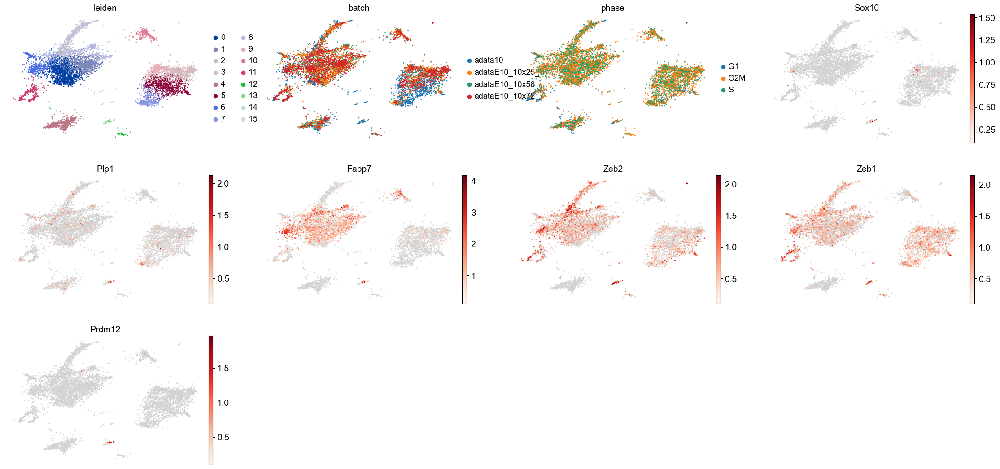

In [194]:
#keep cluster 3,5,9,7 for ectomesen, have to filter some more after
sc.set_figure_params(dpi=50,figsize=[6,4])

sc.pl.embedding(
    adata_E10,
    basis='X_scvi_MDE',
    color=['leiden','batch','phase',
           'Sox10','Plp1','Fabp7','Zeb2','Zeb1','Prdm12',
          ],
    #groups=['3','5','7','9'],
    frameon=False,
    ncols=4,
    cmap = reds,
    vmin=0.1,
)

In [195]:
sc.tl.leiden(adata_E10, #name of anndata object
              resolution = 1.5, key_added = 'leiden_fine')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


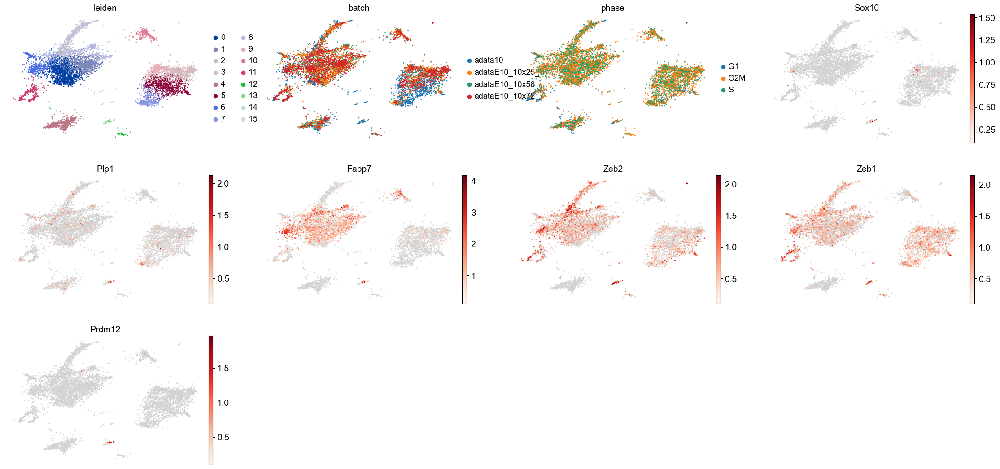

In [196]:
sc.pl.embedding(
    adata_E10,
    basis='X_scvi_MDE',
    color=['leiden','batch','phase',
           'Sox10','Plp1','Fabp7','Zeb2','Zeb1','Prdm12',
          ],
    #groups=['3','5','7','9'],
    frameon=False,
    ncols=4,
    cmap = reds,
    vmin=0.1,
)

In [ ]:
plot_deg_embedding(adata = adata_E10_ecto, 
                   groupby = 'leiden_ecto', 
                   cluster_name = '4', 
                   n_genes = 200, 
                   method = 'wilcoxon',
                   basis = 'X_umap')

In [16]:
adata_E10_mesen = adata_E10[adata_E10.obs['leiden'].isin(['3','5','9','7'])].copy()

In [9]:
sc.pp.neighbors(adata_E10_mesen,  #name of anndata object
                 use_rep = 'X_scvi')
sc.tl.leiden(adata_E10_mesen, #name of anndata object
             resolution = 1)
sc.tl.umap(adata_E10_mesen)
adata_E10_mesen.obsm['X_scvi_MDE'] = scvi.model.utils.mde(adata_E10_mesen.obsm['X_scvi'])

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


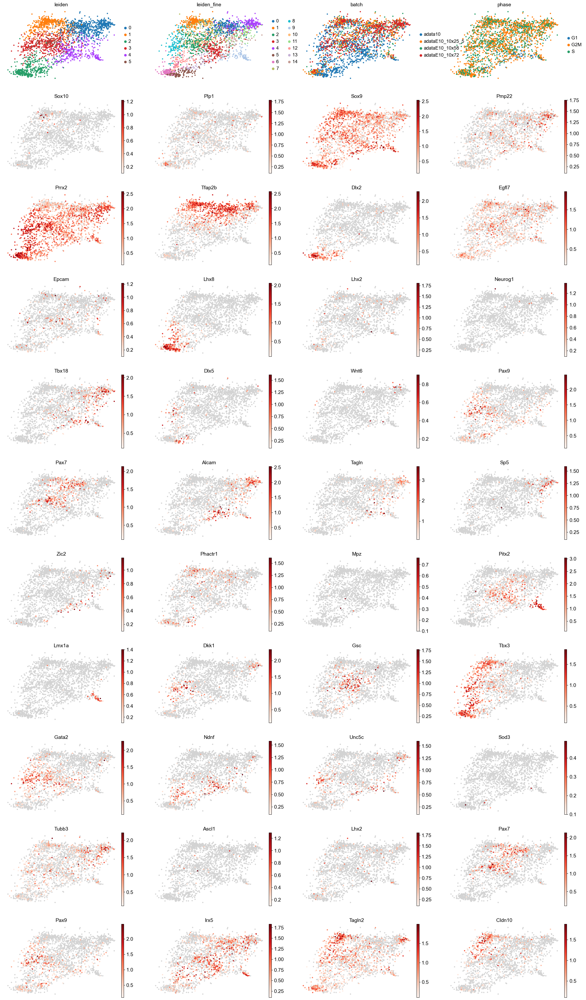

In [202]:
#keep cluster 3,5,9,7 for ectomesen, have to filter some more after
sc.set_figure_params(dpi=50,figsize=[6,4])
sc.pp.neighbors(adata_E10_mesen,  #name of anndata object
                 use_rep = 'X_scvi')
#sc.tl.leiden(adata_E10_mesen, #name of anndata object
#             resolution = .55)
sc.tl.leiden(adata_E10_mesen, #name of anndata object
             resolution = 1.4,
            key_added = 'leiden_fine')
sc.pl.embedding(
    #adata_E10_mesen[adata_E10_mesen.obs['batch']=='adata10'],
    adata_E10_mesen,
    basis='X_scvi_MDE',
    color=['leiden','leiden_fine','batch','phase',
           'Sox10','Plp1','Sox9','Pmp22',
           'Prrx2','Tfap2b','Dlx2',
           'Egfl7', #Endothelial
           'Epcam', #ectoderm
           'Lhx8', #brain stuff
           'Lhx2', #prospective telencephalon
           'Neurog1',
           'Tbx18', #mesoderm
           'Dlx5', 'Wnt6', #placode
           'Pax9', 
           'Pax7',
           'Alcam',
           'Tagln',
           'Sp5',
           'Zic2',
           'Phactr1',
           'Mpz',
           'Pitx2',
           'Lmx1a',
           'Dkk1',
           'Gsc',
           'Tbx3',
           'Gata2',
           'Ndnf',
           'Unc5c',
           'Sod3',
           'Tubb3',
           'Ascl1',
           'Lhx2',
           'Pax7',
           'Pax9',
           'Irx5',
           'Tagln2',
           'Cldn10',
           # 'Six2',
           # 'Ttr',
           # 'Cemip',
           # 'Mctp1',
           # 'Fgf15',
           # 'Tbx15',
           # 'Tbx18',
           # 'Cyp26a1',
           # 'Cyp26b1',
           # 'Cyp26c1',
          ],
    #groups=['3','5','7','9'],
    frameon=False,
    ncols=4,
    cmap = reds,
    vmin=0.1,
)

In [ ]:
#Dorsal nasal Tfap2b Nr2f2                 #FnP
#Lateral nasal Pax7, Gata2 and Gsc         #FnP
#Medial Flrt2 Pax9 Shox2                   #Fnp
#maxillary Dlx2+Lhx2 Cluster Ventral MxP   #MxP
#maxillary Meis2+Six1 cluster oral MxP     #MxP

In [ ]:
plot_deg_embedding(adata = adata_E10_mesen, 
                   groupby = 'leiden_fine', 
                   cluster_name = '9', 
                   n_genes = 200, 
                   method = 'wilcoxon',
                   basis = 'X_scvi_MDE')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


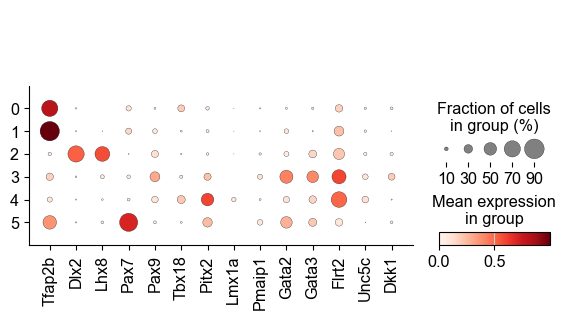

In [108]:
sc.pl.dotplot(adata_E10_mesen, var_names = ['Tfap2b','Dlx2','Lhx8','Pax7','Pax9','Tbx18','Pitx2','Lmx1a','Pmaip1','Gata2','Gata3','Flrt2','Unc5c','Dkk1',], groupby = 'leiden')

In [43]:
#renaming clusters coarse
adata_E10_mesen.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen.obs['leiden'] #create new column
adata_E10_mesen.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen.obs['E10_mesen_annotation_coarse'].cat.add_categories(['Neural Crest',
                                                                                                                        'Frontonasal Mesenchyme',
                                                                                                                        'Maxillary Mesenchyme',
                                                                                                                           'mesoderm_remove',
                                                                                                                           'ocular_remove',])#add category names

adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '1'].obs.index,'E10_mesen_annotation_coarse'] = 'Frontonasal Mesenchyme' #tfap2b+
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '3'].obs.index,'E10_mesen_annotation_coarse'] = 'Frontonasal Mesenchyme' #gata2/3 Dkk1
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '5'].obs.index,'E10_mesen_annotation_coarse'] = 'Frontonasal Mesenchyme' #pax7

adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '2'].obs.index,'E10_mesen_annotation_coarse'] = 'Maxillary Mesenchyme' #dlx2 lhx8
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '0'].obs.index,'E10_mesen_annotation_coarse'] = 'mesoderm_remove' #tbx18
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '4'].obs.index,'E10_mesen_annotation_coarse'] = 'ocular_remove' #ptx2 lmx1a




adata_E10_mesen.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen.obs['E10_mesen_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

In [50]:
#renaming clusters fine
adata_E10_mesen.obs['E10_mesen_annotation_fine'] = adata_E10_mesen.obs['leiden'] #create new column
adata_E10_mesen.obs['E10_mesen_annotation_fine'] = adata_E10_mesen.obs['E10_mesen_annotation_fine'].cat.add_categories(['Neural Crest',
                                                                                                                        'Frontonasal Mesenchyme',
                                                                                                                        'Maxillary Mesenchyme',
                                                                                                                           'mesoderm_remove',
                                                                                                                           'ocular_remove',])#add category names

adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '1'].obs.index,'E10_mesen_annotation_fine'] = 'Frontonasal Mesenchyme' #tfap2b+
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '3'].obs.index,'E10_mesen_annotation_fine'] = 'Frontonasal Mesenchyme' #gata2/3 Dkk1
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '5'].obs.index,'E10_mesen_annotation_fine'] = 'Frontonasal Mesenchyme' #pax7

adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '2'].obs.index,'E10_mesen_annotation_fine'] = 'Maxillary Mesenchyme' #dlx2 lhx8
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '0'].obs.index,'E10_mesen_annotation_fine'] = 'mesoderm_remove' #tbx18
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['leiden'] == '4'].obs.index,'E10_mesen_annotation_fine'] = 'ocular_remove' #ptx2 lmx1a




adata_E10_mesen.obs['E10_mesen_annotation_fine'] = adata_E10_mesen.obs['E10_mesen_annotation_fine'].cat.remove_unused_categories() #remove unused categories

In [24]:
#adata_E10_mesen.write('anndata_objects/adata_E10_mesen_filtered.h5ad')
adata_E10_mesen = sc.read('anndata_objects/adata_E10_mesen_filtered.h5ad')

In [26]:
adata_E10_mesen.obs['source'] = 'lamanno'
adata_E10_mesen.obs.loc[adata_E10_mesen[adata_E10_mesen.obs['batch'] == 'adata10'].obs.index,'source'] = 'kaucka' 
adata_E10_mesen.obs['source'] = adata_E10_mesen.obs['source'].astype('category')

In [28]:
sc.pp.highly_variable_genes(adata_E10_mesen, layer = 'original_counts', n_top_genes = 1000, flavor = 'seurat_v3',subset = True,batch_key = 'source')

In [29]:
adata_E10_mesen

AnnData object with n_obs × n_vars = 2510 × 1000
    obs: 'Clusters', '_X', '_Y', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'sample', 'barcode', 'batch', 'doublet_score', 'predicted_doublets', 'predicted_doublets_based_on_10x_chromium_spec', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'pct_counts_unspliced', 'pred_doubl_cat', 'stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'leiden_fine', 'E10_mesen_annotation_coarse', 'E10_mesen_annotation_fine', 'source'
    var: 'gene_name', 'ensembl_id', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'leiden', 'leiden_fine_colors', 'log1p', 'neighbors', 'phase_colors', 'rank_genes_groups_wilcoxon', 'wilcoxon

Anndata setup with scvi-tools version 1.0.4.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'original_counts',
│   'batch_key': 'batch',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': ['S_score', 'G2M_score']
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   4   │
│         n_cells          │ 1527  │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   2   │
│         n_labels         │   1   │
│          n_vars          │ 1000  │
└──────────────────────────┴───────┘

                            Data Registry                            
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Registry Key      ┃            scvi-tools Location            ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│           X           │      adata.layers['original_counts']      │
│         batch         │         adata.obs['_scvi_batch']          │
│ extra_continuous_covs │ adata.obsm['_scvi_extra_continuous_covs'] │
│        labels         │         adata.obs['_scvi_labels']         │
└───────────────────────┴───────────────────────────────────────────┘

                     batch State Registry                      
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃    Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch'] │     adata10      │          0          │
│                    │ adataE10_10x25_5 │          1          │
│                    │  adataE10_10x58  │          2          │
│                    │  adataE10_10x72  │          3          │
└────────────────────┴──────────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

  extra_continuous_covs   
      State Registry      
┏━━━━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━┩
│  adata.obs['S_score']  │
│ adata.obs['G2M_score'] │
└────────────────────────┘

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


None
Epoch 300/300: 100%|██████████| 300/300 [00:19<00:00, 15.49it/s, v_num=1, train_loss_step=804, train_loss_epoch=844]      

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████████| 300/300 [00:19<00:00, 15.57it/s, v_num=1, train_loss_step=804, train_loss_epoch=844]


/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


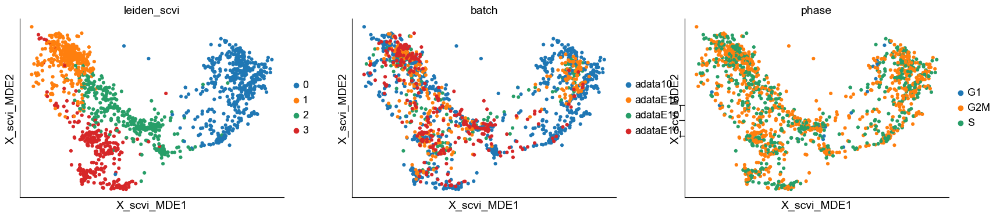

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


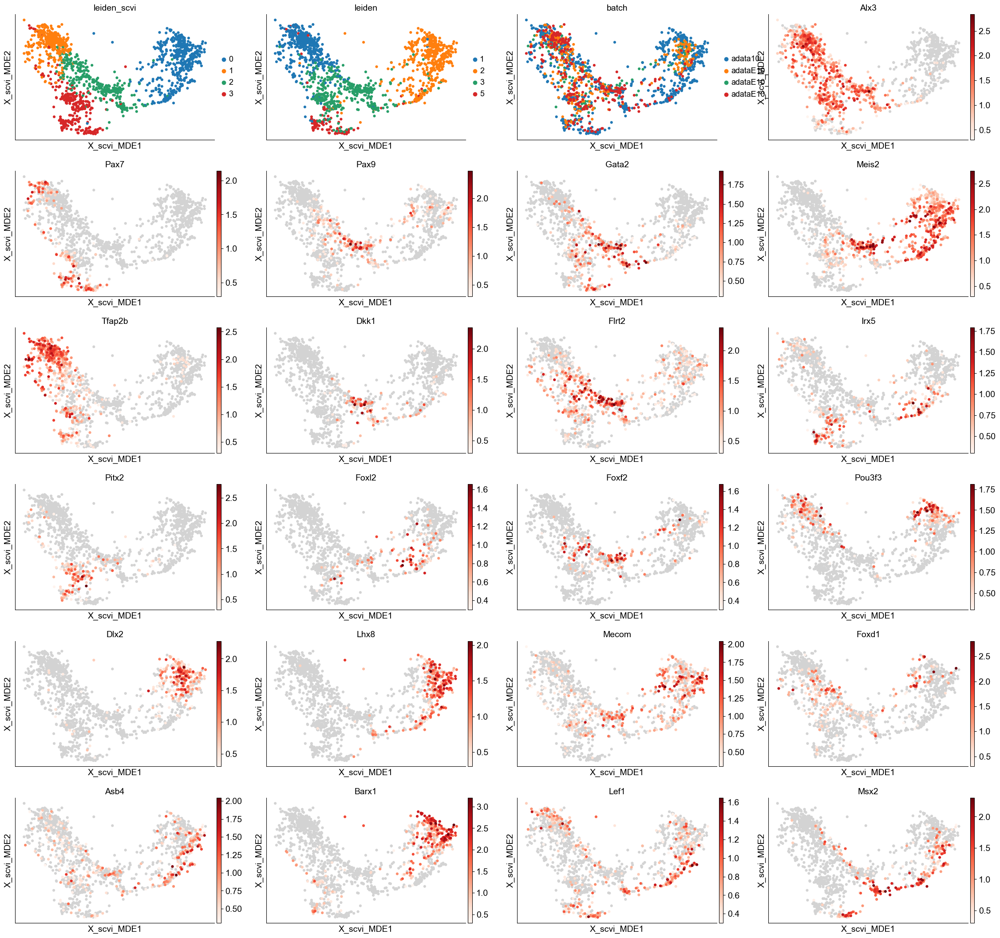

In [71]:
sc.set_figure_params(dpi=50,figsize=[6,4])

adata_E10_mesen_subset_test = adata_E10_mesen[adata_E10_mesen.obs['leiden'].isin(['1','3','5','2',])].copy()
scvi_anndata_test(adata_E10_mesen_subset_test,n_latent=30,max_epochs=300, resolution = .5, batch_key = 'batch',
                  continuous_covariate_keys = ['S_score','G2M_score',
                                               #'pct_counts_mt'
                                              ],
                 #categorical_covariate_keys = ['source'],
                 )
sc.pl.embedding(adata_E10_mesen_subset_test,
                basis='X_scvi_MDE',
                #basis='X_umap',
                color = ['leiden_scvi','leiden','batch','Alx3','Pax7','Pax9','Gata2','Meis2','Tfap2b','Dkk1','Flrt2','Irx5','Pitx2','Foxl2','Foxf2','Pou3f3','Dlx2','Lhx8','Mecom','Foxd1',
                                        'Asb4','Barx1','Lef1','Msx2'],
           ncols=4, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/sca

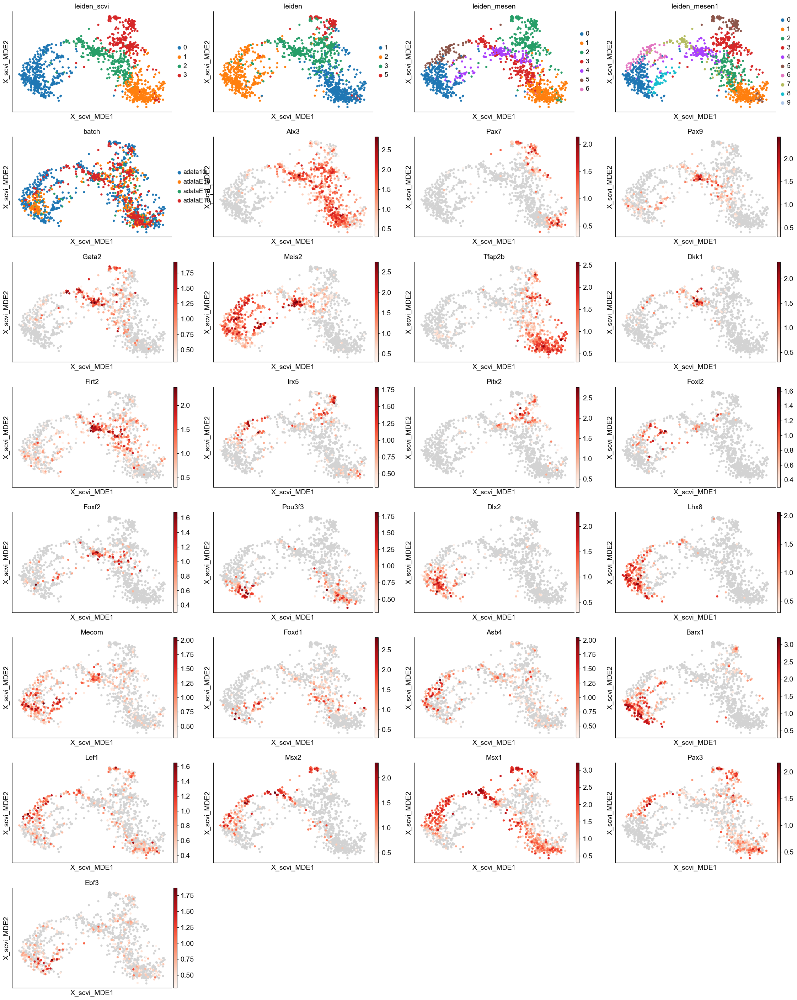

In [102]:
#adata_E10_mesen_subset_test.obsm['X_scvi_MDE'] = scvi.model.utils.mde(adata_E10_mesen_subset_test.obsm['X_scvi']) 
sc.tl.leiden(adata_E10_mesen_subset_test, resolution = .7, key_added = 'leiden_mesen.7')
sc.tl.leiden(adata_E10_mesen_subset_test, resolution = 1, key_added = 'leiden_mesen1')


sc.pl.embedding(adata_E10_mesen_subset_test,
                basis='X_scvi_MDE',
                #basis='X_umap',
                color = ['leiden_scvi','leiden','leiden_mesen','leiden_mesen1','batch','Alx3','Pax7','Pax9','Gata2','Meis2','Tfap2b','Dkk1','Flrt2','Irx5','Pitx2','Foxl2','Foxf2','Pou3f3','Dlx2',
                         'Lhx8','Mecom','Foxd1',
                                        'Asb4','Barx1','Lef1','Msx2','Msx1','Pax3','Ebf3',],
           ncols=4, cmap=reds, vmin=0.3)

In [9]:
#renaming clusters coarse
adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen_subset_test.obs['leiden_scvi'] #create new column
adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse'].cat.add_categories(['Posterior MxP',
                                                                                                                                                    'Anterior MxP',
                                                                                                                                                    'Dorsal NP',
                                                                                                                                                    'Medial NP',
                                                                                                                                                    'Lateral NP',
                                                                                                                                                   ])#add category names

adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['leiden_scvi'] == '0'].obs.index,'E10_mesen_annotation_coarse'] = 'Posterior MxP' #Barx1+
adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['leiden_scvi'] == '1'].obs.index,'E10_mesen_annotation_coarse'] = 'Dorsal NP' #Tfap2b+
adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['leiden_scvi'] == '2'].obs.index,'E10_mesen_annotation_coarse'] = 'Medial NP' #Flrt2+
adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['leiden_scvi'] == '3'].obs.index,'E10_mesen_annotation_coarse'] = 'Lateral NP' #Pax7+

adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['leiden_mesen'] == '5'].obs.index,'E10_mesen_annotation_coarse'] = 'Anterior MxP' #Msx2/Irx5+





adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

adata_E10_mesen_subset_test.obs['integration_label'] = 'FnP'
adata_E10_mesen_subset_test.obs.loc[adata_E10_mesen_subset_test[adata_E10_mesen_subset_test.obs['E10_mesen_annotation_fine'] == 'Maxillary Mesenchyme'].obs.index,'integration_label'] = 'MxP'
adata_E10_mesen_subset_test.obs['integration_label'] = adata_E10_mesen_subset_test.obs['integration_label'].astype('category')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


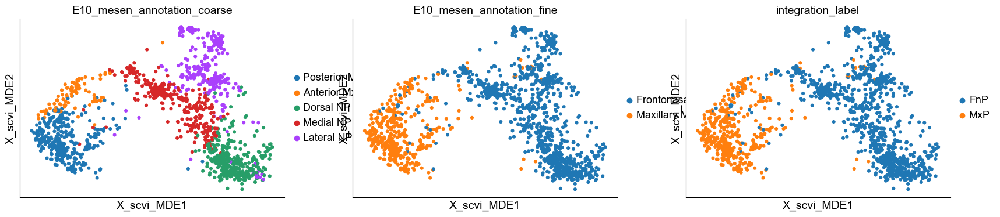

In [10]:
sc.pl.embedding(adata_E10_mesen_subset_test,
                basis='X_scvi_MDE',
                #basis='X_umap',
                color = ['E10_mesen_annotation_coarse','E10_mesen_annotation_fine','integration_label'],
           ncols=4, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


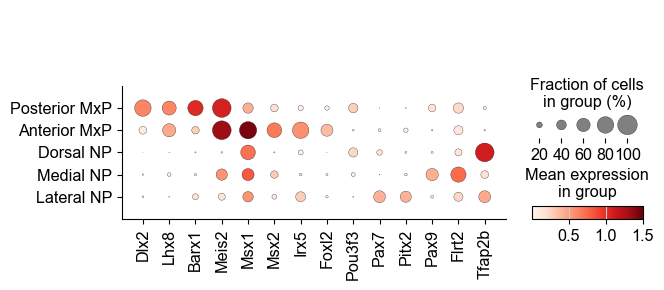

In [95]:
sc.pl.dotplot(adata_E10_mesen_subset_test, var_names = ['Dlx2','Lhx8','Barx1','Meis2','Msx1','Msx2','Irx5','Foxl2','Pou3f3','Pax7','Pitx2','Pax9','Flrt2','Tfap2b',], 
              groupby = 'E10_mesen_annotation_coarse',
              vmax = 1.5,
             )

In [ ]:
plot_deg_embedding(adata = adata_E10_mesen_subset_test, 
                   groupby = 'E10_mesen_annotation_coarse', 
                   cluster_name = 'Posterior MxP', 
                   n_genes = 200, 
                   method = 'wilcoxon',
                   basis = 'X_scvi_MDE')

In [15]:
adata_E10_mesen_subset_all_genes = adata_E10[adata_E10_mesen_subset_test.obs.index].copy()

In [18]:
adata_E10_mesen_subset_all_genes.obs['integration_label'] = adata_E10_mesen_subset_test.obs['integration_label']
adata_E10_mesen_subset_all_genes.obs['E10_mesen_annotation_fine'] = adata_E10_mesen_subset_test.obs['E10_mesen_annotation_fine']
adata_E10_mesen_subset_all_genes.obs['E10_mesen_annotation_coarse'] = adata_E10_mesen_subset_test.obs['E10_mesen_annotation_coarse']
adata_E10_mesen_subset_all_genes.obsm['X_scvi_MDE'] = adata_E10_mesen_subset_test.obsm['X_scvi_MDE']

In [17]:
adata_E10_mesen_subset_test

AnnData object with n_obs × n_vars = 1527 × 1000
    obs: 'Clusters', '_X', '_Y', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'sample', 'barcode', 'batch', 'doublet_score', 'predicted_doublets', 'predicted_doublets_based_on_10x_chromium_spec', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'pct_counts_unspliced', 'pred_doubl_cat', 'stage', 'S_score', 'G2M_score', 'phase', '_scvi_batch', '_scvi_labels', 'leiden', 'leiden_fine', 'E10_mesen_annotation_coarse', 'E10_mesen_annotation_fine', 'source', 'leiden_scvi', 'leiden_mesen', 'leiden_mesen.7', 'leiden_mesen1', 'integration_label'
    var: 'gene_name', 'ensembl_id', 'mt', 'rb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'E10_mesen_annotation_coarse_colors', '_scvi_manager_uuid', '_scvi_uuid', 

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


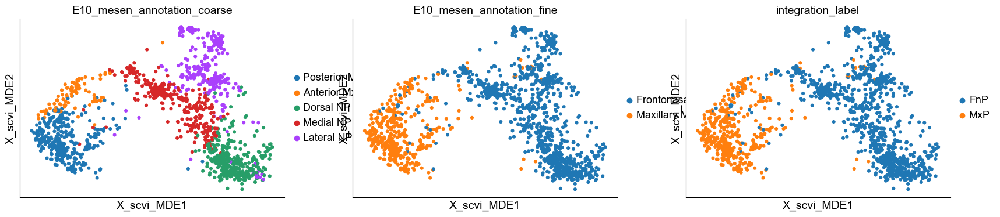

In [19]:
sc.pl.embedding(adata_E10_mesen_subset_all_genes,
                basis='X_scvi_MDE',
                #basis='X_umap',
                color = ['E10_mesen_annotation_coarse','E10_mesen_annotation_fine','integration_label'],
           ncols=4, cmap=reds, vmin=0.3)

In [20]:
#adata_E10_mesen_subset_all_genes.write('anndata_objects/adata_E10_mesen_annotated.h5ad')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


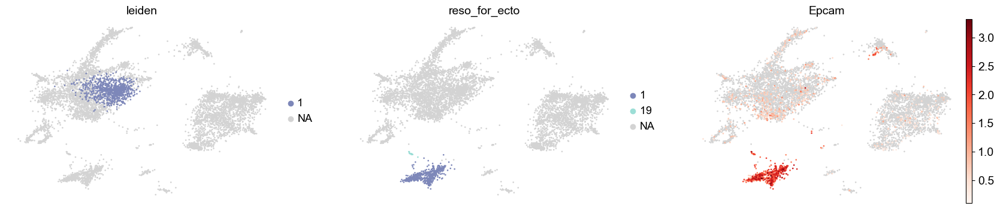

In [106]:
sc.tl.leiden(adata_E10, resolution = 1.4, key_added='reso_for_ecto')
sc.pl.embedding(
    #adata_E10_mesen[adata_E10_mesen.obs['batch']=='adata10'],
    adata_E10,
    basis='X_scvi_MDE',
    color=['leiden','reso_for_ecto','Epcam',],
    groups=['1','19'],
    frameon=False,
    ncols=4,
    cmap = reds,
    vmin=0.1,
)

In [ ]:
plot_deg_embedding(adata = adata_E10, 
                   groupby = 'reso_for_ecto', 
                   cluster_name = '19', 
                   n_genes = 200, 
                   method = 'wilcoxon',
                   basis = 'X_scvi_MDE')

In [107]:
adata_E10_ecto = adata_E10[adata_E10.obs['reso_for_ecto'].isin(['1','19'])].copy()

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


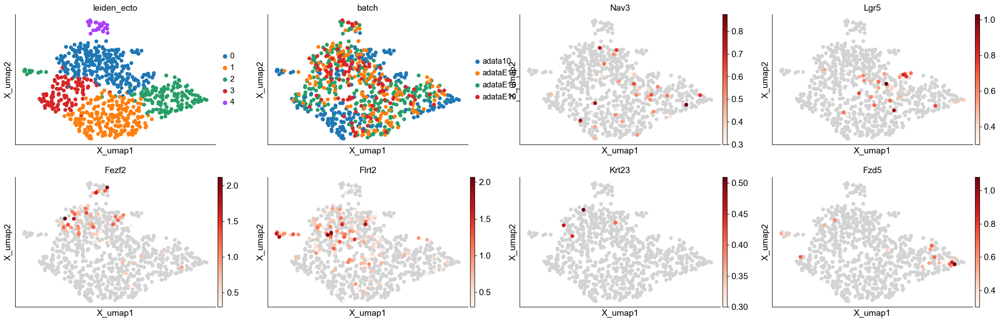

In [113]:
sc.tl.umap(adata_E10_ecto)
sc.tl.leiden(adata_E10_ecto, resolution = 0.4, key_added = 'leiden_ecto')
sc.pl.embedding(adata_E10_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','batch','Nav3','Lgr5','Fezf2','Flrt2','Krt23','Fzd5',],
           ncols=4, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


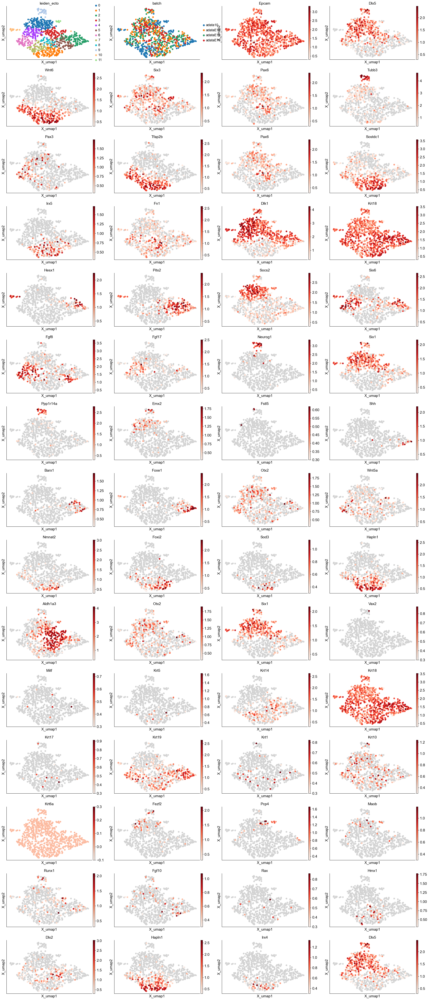

In [134]:
sc.tl.leiden(adata_E10_ecto, resolution = 1.2, key_added = 'leiden_ecto')

sc.pl.embedding(adata_E10_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','batch','Epcam','Dlx5','Wnt6','Six3','Pax6','Tubb3','Pax3','Tfap2b',
                         'Pax6','Sostdc1','Irx5','Fn1','Dlk1','Krt18','Hesx1','Pitx2','Socs2','Six6','Fgf8','Fgf17','Neurog1','Six1','Ppp1r14a','Emx2','Fstl5','Shh','Barx1','Foxe1','Otx2','Wnt5a',
                        'Nmnat2','Foxi2','Sod3','Hapln1','Aldh1a3','Otx2','Six1','Vax2','Mitf',
                        'Krt5','Krt14','Krt18','Krt17','Krt19','Krt1','Krt10','Krt6a','Fezf2','Pcp4','Maob','Runx1','Fgf10','Rax','Hmx1','Dlx2','Hapln1','Irx4','Dlx5'],
           ncols=4, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


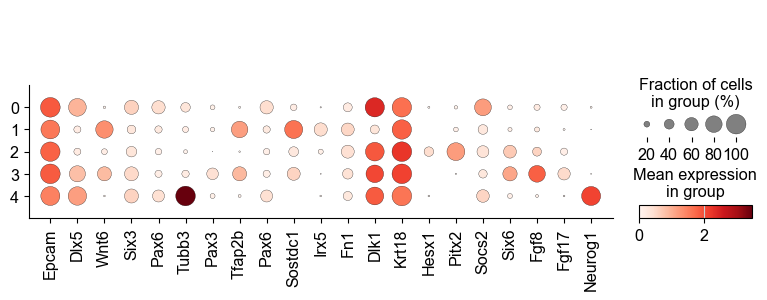

In [131]:
sc.pl.dotplot(adata_E10_ecto, var_names = ['Epcam','Dlx5','Wnt6','Six3','Pax6','Tubb3','Pax3','Tfap2b',
                         'Pax6','Sostdc1','Irx5','Fn1','Dlk1','Krt18','Hesx1','Pitx2','Socs2','Six6','Fgf8','Fgf17','Neurog1'], groupby = 'leiden_ecto')

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


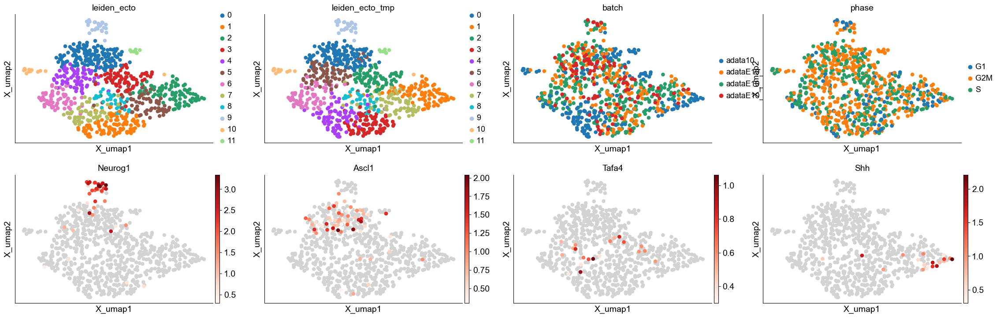

In [180]:

sc.tl.leiden(adata_E10_ecto, resolution = 1.5, key_added = 'leiden_ecto_tmp')

sc.pl.embedding(adata_E10_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['leiden_ecto','leiden_ecto_tmp','batch','phase','Neurog1','Ascl1','Tafa4','Shh',],
           ncols=4, cmap=reds, vmin=0.3)

In [132]:
adata_E10_ecto.write('anndata_objects/adata_E10_ecto_tmp.h5ad')

In [4]:
adata_E10_ecto = sc.read('anndata_objects/adata_E10_ecto_annotated.h5ad')

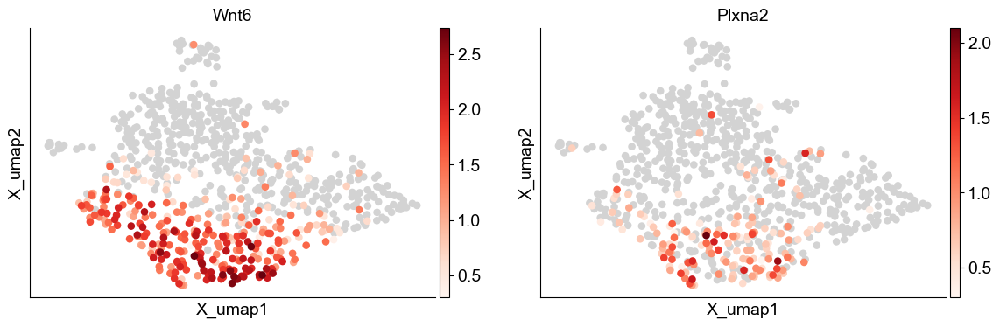

In [5]:
sc.pl.embedding(adata_E10_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['Wnt6','Plxna2',],
           ncols=4, cmap=reds, vmin=0.3)

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


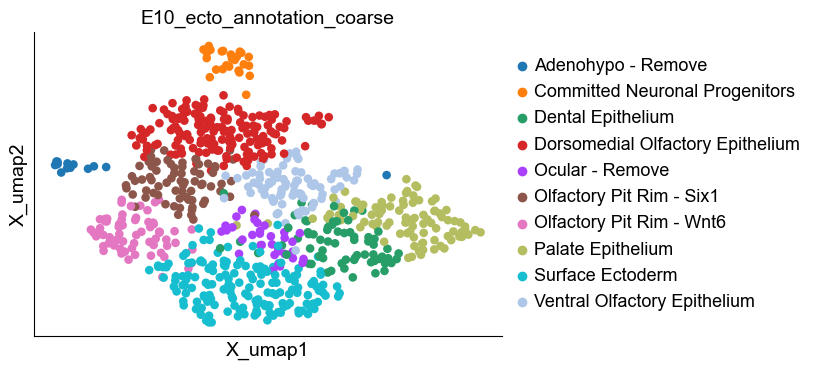

/home/jupyter-seton/micromamba/envs/cellrank/lib/python3.11/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


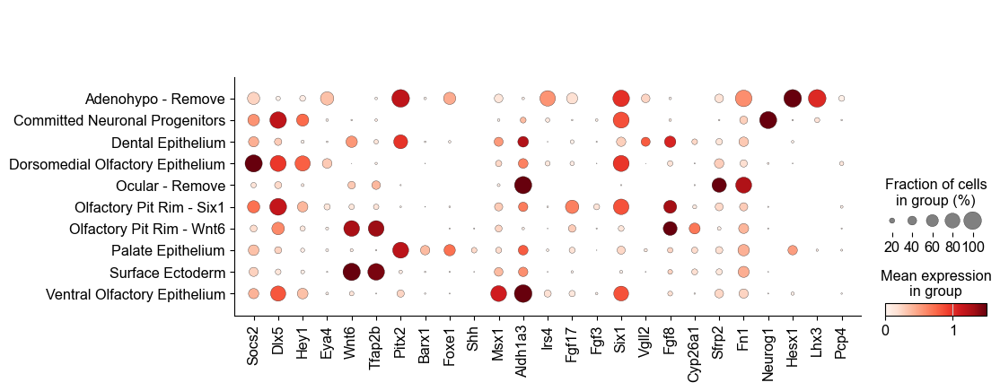

In [182]:
#renaming clusters coarse
adata_E10_ecto.obs['E10_ecto_annotation_coarse'] = 'tmp'

adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '0'].obs.index,'E10_ecto_annotation_coarse'] = 'Dorsomedial Olfactory Epithelium' #Socs2 Dlk1 Dlx5 Hey1 Eya4 Will become neuronal and non neuronal progenitors
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '1'].obs.index,'E10_ecto_annotation_coarse'] = 'Surface Ectoderm' #Wnt6 Tfap2b
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '2'].obs.index,'E10_ecto_annotation_coarse'] = 'Palate Epithelium' #Pitx2 Barx1 Foxe1 Shh
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '3'].obs.index,'E10_ecto_annotation_coarse'] = 'Ventral Olfactory Epithelium' #Msx1 Ctxn3 Dlx5 Aldh1a3 Irs4 
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '4'].obs.index,'E10_ecto_annotation_coarse'] = 'Olfactory Pit Rim - Six1' #Fgf17 Fgf3 Six1  Fgf8
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '5'].obs.index,'E10_ecto_annotation_coarse'] = 'Dental Epithelium' #Vgll2 + Fgf8 and other oral stuff (pitx2 etc) (hinge ecto?) Oral
#https://www.informatics.jax.org/assay/MGI:5603214#4A_id
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '6'].obs.index,'E10_ecto_annotation_coarse'] = 'Olfactory Pit Rim - Wnt6' #Fgf8 Cyp26a1 Wnt6 Vgll3
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '7'].obs.index,'E10_ecto_annotation_coarse'] = 'Surface Ectoderm' #Same as cluster1 just some batch effect still
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '8'].obs.index,'E10_ecto_annotation_coarse'] = 'Ocular - Remove' #Sfrp2 Fn1 Pax6 cluster, this is eye placode
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '9'].obs.index,'E10_ecto_annotation_coarse'] = 'Committed Neuronal Progenitors' #Neurog1 We see our first 2 Fstl5 immature neurons
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '10'].obs.index,'E10_ecto_annotation_coarse'] = 'Adenohypo - Remove' #Hesx1 Lhx3 Remove
adata_E10_ecto.obs.loc[adata_E10_ecto[adata_E10_ecto.obs['leiden_ecto'] == '11'].obs.index,'E10_ecto_annotation_coarse'] = 'Dorsomedial Olfactory Epithelium' #Pcp4+, idk I would merge with cluster 0


adata_E10_ecto.obs['E10_ecto_annotation_coarse'] = adata_E10_ecto.obs['E10_ecto_annotation_coarse'].astype('category')




#Hesx1 Pitx2 #Fgf8- Barx1- Remove

#Remove Sfrp2 Hmx1 Sapcd1 + cluster this is eye

#Cxcl14 and Wnt3

#Pcdh4

#Wnt6 surface ectoderm
#Separate dental from palate
#fgf8 Cyp26a1 Wnt6+ cluster Olfactory placode rim surface
#Fgf8 Fgf3 Six1 + Olfactory placode rim nasal cavity 

#other Six1 cluster is Olfactory Epithelium

#theres a Sfrp2 Fn1 Pax6 cluster, this is eye placode?

adata_E10_ecto.obs['E10_ecto_annotation_coarse'] = adata_E10_ecto.obs['E10_ecto_annotation_coarse'].cat.remove_unused_categories() #remove unused categories

sc.pl.embedding(adata_E10_ecto,
               # basis='X_harmony_MDE',
                basis='X_umap',
                color = ['E10_ecto_annotation_coarse',],
                ncols=4, cmap=reds, vmin=0.3)

sc.pl.dotplot(adata_E10_ecto, var_names = ['Socs2','Dlx5','Hey1','Eya4','Wnt6','Tfap2b','Pitx2','Barx1','Foxe1','Shh','Msx1','Aldh1a3','Irs4','Fgf17','Fgf3','Six1','Vgll2','Fgf8',
                                           'Cyp26a1','Sfrp2','Fn1','Neurog1','Hesx1','Lhx3','Pcp4'], groupby = 'E10_ecto_annotation_coarse',vmax = 1.5)

In [183]:
adata_E10_ecto.write('anndata_objects/adata_E10_ecto_annotated.h5ad')